# Obter dataset a partir do API do Kaggle

In [1]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"pedro21afonso","key":"4a1430583be9a7d696719b804b21144b"}'}

In [2]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [3]:
!kaggle datasets download "miljan/stanford-dogs-dataset-traintest"

Dataset URL: https://www.kaggle.com/datasets/miljan/stanford-dogs-dataset-traintest
License(s): other
 98% 385M/393M [00:01<00:00, 308MB/s]
100% 393M/393M [00:01<00:00, 399MB/s]


In [4]:
!unzip stanford-dogs-dataset-traintest.zip -d /content/stanford-dogs-dataset-traintest

A saída de streaming foi truncada nas últimas 5000 linhas.
  inflating: /content/stanford-dogs-dataset-traintest/cropped/train/n02102973-Irish_water_spaniel/n02102973_1066.jpg  
  inflating: /content/stanford-dogs-dataset-traintest/cropped/train/n02102973-Irish_water_spaniel/n02102973_1140.jpg  
  inflating: /content/stanford-dogs-dataset-traintest/cropped/train/n02102973-Irish_water_spaniel/n02102973_1200.jpg  
  inflating: /content/stanford-dogs-dataset-traintest/cropped/train/n02102973-Irish_water_spaniel/n02102973_1270.jpg  
  inflating: /content/stanford-dogs-dataset-traintest/cropped/train/n02102973-Irish_water_spaniel/n02102973_1299.jpg  
  inflating: /content/stanford-dogs-dataset-traintest/cropped/train/n02102973-Irish_water_spaniel/n02102973_1318.jpg  
  inflating: /content/stanford-dogs-dataset-traintest/cropped/train/n02102973-Irish_water_spaniel/n02102973_1409.jpg  
  inflating: /content/stanford-dogs-dataset-traintest/cropped/train/n02102973-Irish_water_spaniel/n02102973_

# EDA

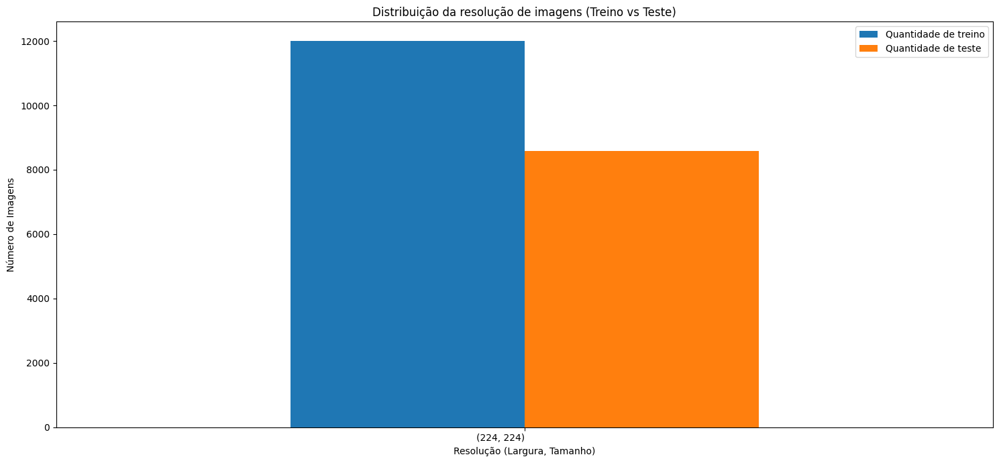

In [ ]:
from PIL import Image
import os
import matplotlib.pyplot as plt
import pandas as pd

def check_image_resolutions(directory):
    resolutions = {}
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('jpg', 'jpeg', 'png')):
                img_path = os.path.join(root, file)
                try:
                    with Image.open(img_path) as img:
                        resolution = img.size
                        if resolution not in resolutions:
                            resolutions[resolution] = 0
                        resolutions[resolution] += 1
                except Exception as e:
                    print(f"Could not open image {img_path}: {e}")
    return resolutions

train_data_dir = '/content/stanford-dogs-dataset-traintest/cropped/train'
test_data_dir = '/content/stanford-dogs-dataset-traintest/cropped/test'

train_resolutions = check_image_resolutions(train_data_dir)
test_resolutions = check_image_resolutions(test_data_dir)

all_resolutions = set(train_resolutions.keys()) | set(test_resolutions.keys())
df_resolutions = pd.DataFrame(index=list(all_resolutions))

df_resolutions['Quantidade de treino'] = df_resolutions.index.map(train_resolutions).fillna(0)
df_resolutions['Quantidade de teste'] = df_resolutions.index.map(test_resolutions).fillna(0)

df_resolutions = df_resolutions.sort_index()

fig, ax = plt.subplots(1, 1, figsize=(15, 7))
df_resolutions.plot(kind="bar", ax=ax)

plt.title("Distribuição da resolução de imagens (Treino vs Teste)")
plt.xlabel("Resolução (Largura, Tamanho)")
plt.ylabel("Número de Imagens")
plt.xticks(rotation=0, ha='right')
plt.tight_layout()
plt.show()

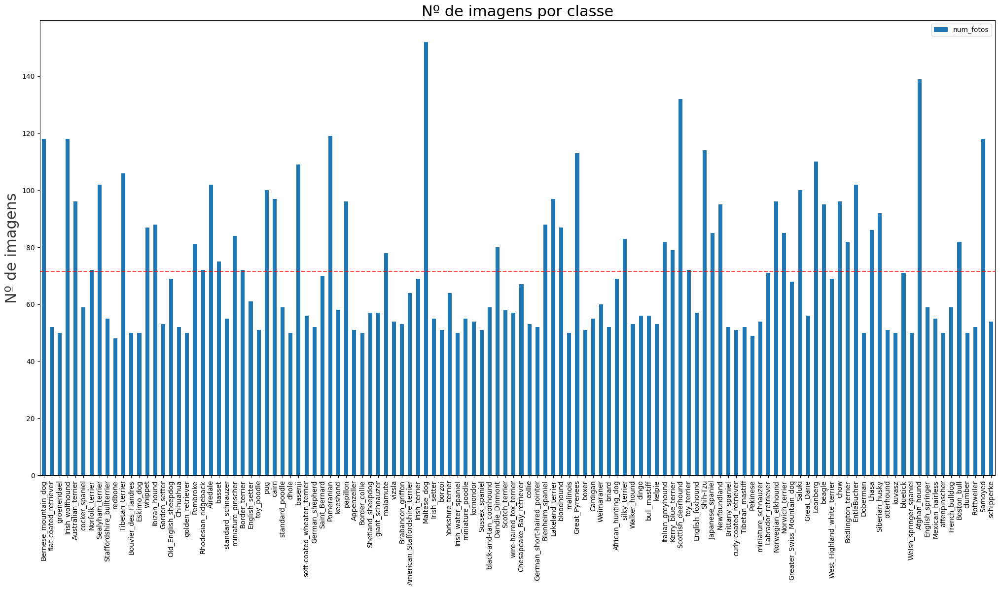

In [ ]:
train_data_dir = '/content/stanford-dogs-dataset-traintest/cropped/train'
test_data_dir = '/content/stanford-dogs-dataset-traintest/cropped/test'

breeds = os.listdir(test_data_dir)

df_breeds = pd.DataFrame(
    index=[breed.split('-',1)[1]
           for breed in breeds],
    data=[len(os.listdir(test_data_dir + "/" + name))
          for name in breeds],
    columns=["num_fotos"])

# Plot results
fig, ax = plt.subplots(1, 1, figsize=(25,12))
df_breeds.plot(kind="bar",
               legend=False,
               ax=ax)
ax.axhline(df_breeds["num_fotos"].mean(),
           color='r', alpha=.7,
           linestyle='--')
plt.title("Nº de imagens por classe",
          fontsize=22)
plt.ylabel("Nº de imagens",
          color="#343434", fontsize=22)
plt.legend()
plt.show()

In [ ]:
def show_images_classes(path, classes, num_sample):
    """This function is used to display the first
    n images of a directory passed as an argument.
    It is adapted to subdirectories.

    The matplotlib.image library must be loaded
    with the alias mpimg.

    Parameters
    ----------------------------------------
    path : string
        Link of root directory
    classes : string
        Name of the subdirectory
    num_smaple : integer
        Number of picture to show
    ----------------------------------------
    """
    fig = plt.figure(figsize=(20,20))
    fig.patch.set_facecolor('#343434')
    plt.suptitle("{}".format(classes.split("-")[1]), y=.83,
                 color="white", fontsize=22)
    images = os.listdir(path + "/" + classes)[:num_sample]
    for i in range(num_sample):
        img = mpimg.imread(path+"/"+classes+"/"+images[i]) # Now 'mpimg' is defined and can be used
        plt.subplot(num_sample//5+1, 5, i+1)
        plt.imshow(img)
        plt.axis('off')
    plt.show()

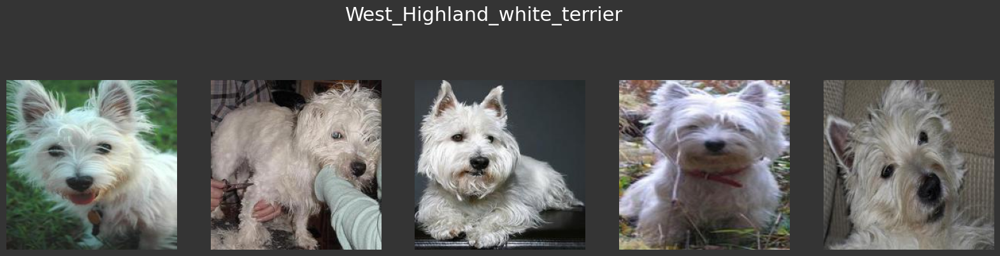

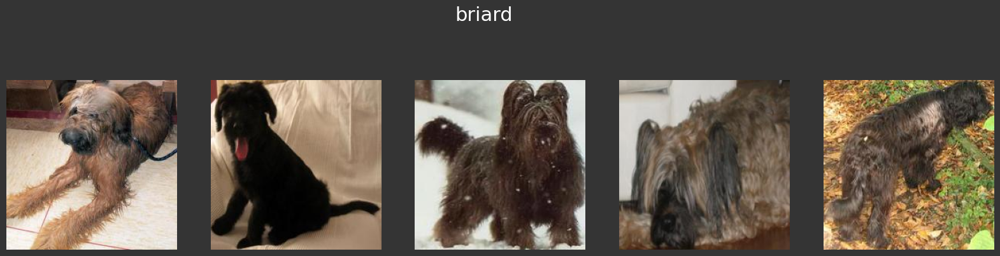

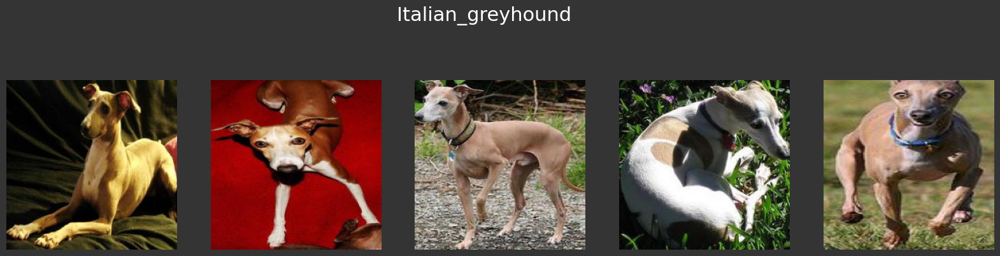

In [ ]:
for i in np.random.randint(0, len(breeds), size=3):
    show_images_classes(train_data_dir, breeds[i], 5)

In [ ]:
from PIL import Image
NUM_IMAGES = 500

# Get all image paths
image_paths = []
for root, _, files in os.walk(train_data_dir):
    for file in files:
        if file.lower().endswith(('jpg', 'jpeg', 'png')):
            image_paths.append(os.path.join(root, file))
image_paths = image_paths[:NUM_IMAGES]

# Initialize RGB channel lists
r_vals, g_vals, b_vals = [], [], []

# Load and extract pixel values
for path in image_paths:
    img = Image.open(path).convert("RGB")
    img_np = np.array(img)

    r_vals.extend(img_np[:, :, 0].flatten())
    g_vals.extend(img_np[:, :, 1].flatten())
    b_vals.extend(img_np[:, :, 2].flatten())

# Plot histograms
plt.figure(figsize=(10, 4))
plt.hist(r_vals, bins=256, color='r', alpha=0.5, label='Red')
plt.hist(g_vals, bins=256, color='g', alpha=0.5, label='Green')
plt.hist(b_vals, bins=256, color='b', alpha=0.5, label='Blue')
plt.title('RGB Color Distribution (Sample of Images)')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()
plt.tight_layout()
plt.show()

# Criar splits de treino, validação e teste

In [5]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import scipy.io as sio
import numpy as np
import pandas as pd
import os
import shutil
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [8]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    validation_split=0.2,
)
valid_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
)

test_datagen = ImageDataGenerator(
    rescale=1./255,
)

In [9]:
img_height = 224
img_width = 224
batch_size = 64
train_data_dir = '/content/stanford-dogs-dataset-traintest/cropped/train'
test_data_dir = '/content/stanford-dogs-dataset-traintest/cropped/test'

print('Train')
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size= (img_width, img_height),
    color_mode= 'rgb',
    batch_size= batch_size,
    class_mode= 'categorical',
    subset='training',
    shuffle= True,
    seed= 1337
)

print('Valid')
valid_generator = valid_datagen.flow_from_directory(
    train_data_dir,
    target_size= (img_width, img_height),
    color_mode= 'rgb',
    batch_size= batch_size,
    class_mode= 'categorical',
    subset='validation',
    shuffle= True,
    seed= 1337
)

print('Test')
test_generator = test_datagen.flow_from_directory(test_data_dir,
    target_size= (img_width, img_height),
    color_mode= 'rgb',
    batch_size= batch_size,
    class_mode= 'categorical',
    shuffle=False,
    seed= 1337)

Train
Found 9600 images belonging to 120 classes.
Valid
Found 2400 images belonging to 120 classes.
Test
Found 8580 images belonging to 120 classes.


# Obter nº de labels e preparar as labels

In [10]:
num_classes = len(train_generator.class_indices)

train_labels = train_generator.classes
train_labels = tf.keras.utils.to_categorical(train_labels, num_classes=num_classes)
valid_labels = valid_generator.classes
valid_labels = tf.keras.utils.to_categorical(valid_labels, num_classes=num_classes)
test_labels = test_generator.classes
test_labels = tf.keras.utils.to_categorical(test_labels, num_classes=num_classes)

nb_train_samples = len(train_generator.filenames)
nb_valid_samples = len(valid_generator.filenames)

class_labels = list(test_generator.class_indices.keys())

# Mostrar imagens com data augmentation

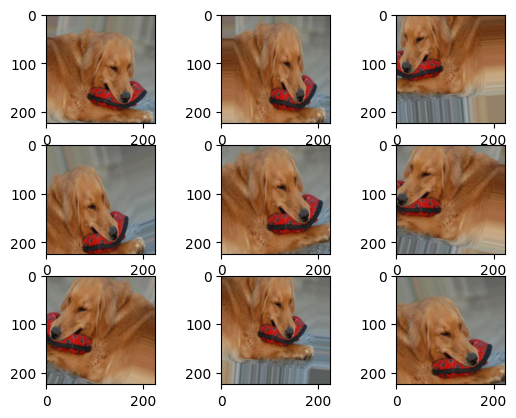

In [ ]:
img = tf.keras.preprocessing.image.load_img('/content/stanford-dogs-dataset-traintest/cropped/train/n02099601-golden_retriever/n02099601_10.jpg')
data = tf.keras.preprocessing.image.img_to_array(img)
samples = np.expand_dims(data, 0)
it = train_datagen.flow(samples, batch_size=1)

for i in range(9):
    plt.subplot(330 + 1 + i)
    batch = next(it)
    image = batch[0]
    plt.imshow(image)

plt.show()

# CNN

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.BatchNormalization(input_shape=(img_height, img_width, 3)),
    tf.keras.layers.Conv2D(16, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.BatchNormalization(),

    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.BatchNormalization(),

    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.BatchNormalization(),

    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.BatchNormalization(),

    tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.BatchNormalization(),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(120, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/normalization/batch_normalization.py:142: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ batch_normalization             │ (None, 224, 224, 3)    │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 222, 222, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 111, 111, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 54, 54, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 26, 26, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 12, 12, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 10, 10, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 5, 5, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 6400)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 256)            │     1,638,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 120)            │        30,840 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,064,100 (7.87 MB)

 Trainable params: 2,063,102 (7.87 MB)

 Non-trainable params: 998 (3.90 KB)

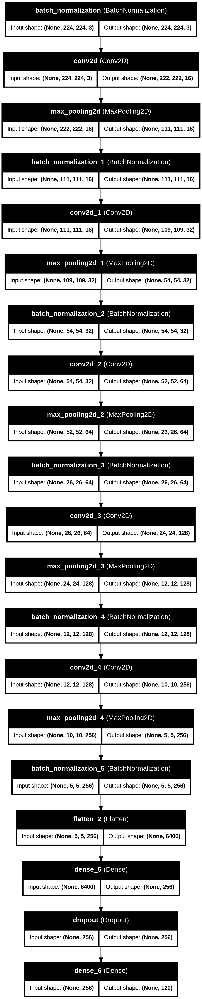

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True)

CNN com 2 layers e max pooling early stop 4 epochs, val acc e val loss estagnou.

Segunda CNN early stop 1 h 10 min a treinar, 0.17 val acc
RAM GPU muito alta a treinar

Terceira CNN early stopping 32min e 12 s, batch size = 8, RAM GPU very low, val acc 0.1996

In [ ]:
model.save('stanford-dogs-dataset-CNN3.keras')

# MLP

In [ ]:
model = tf.keras.Sequential([
  tf.keras.layers.Flatten(input_shape=(img_height, img_width, 3)),
  tf.keras.layers.Dense(512, activation='relu',),
  tf.keras.layers.Dense(256, activation='relu'),
  tf.keras.layers.Dense(num_classes, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_1 (Flatten)             │ (None, 150528)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │    77,070,848 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 120)            │        30,840 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 77,233,016 (294.62 MB)

 Trainable params: 77,233,016 (294.62 MB)

 Non-trainable params: 0 (0.00 B)

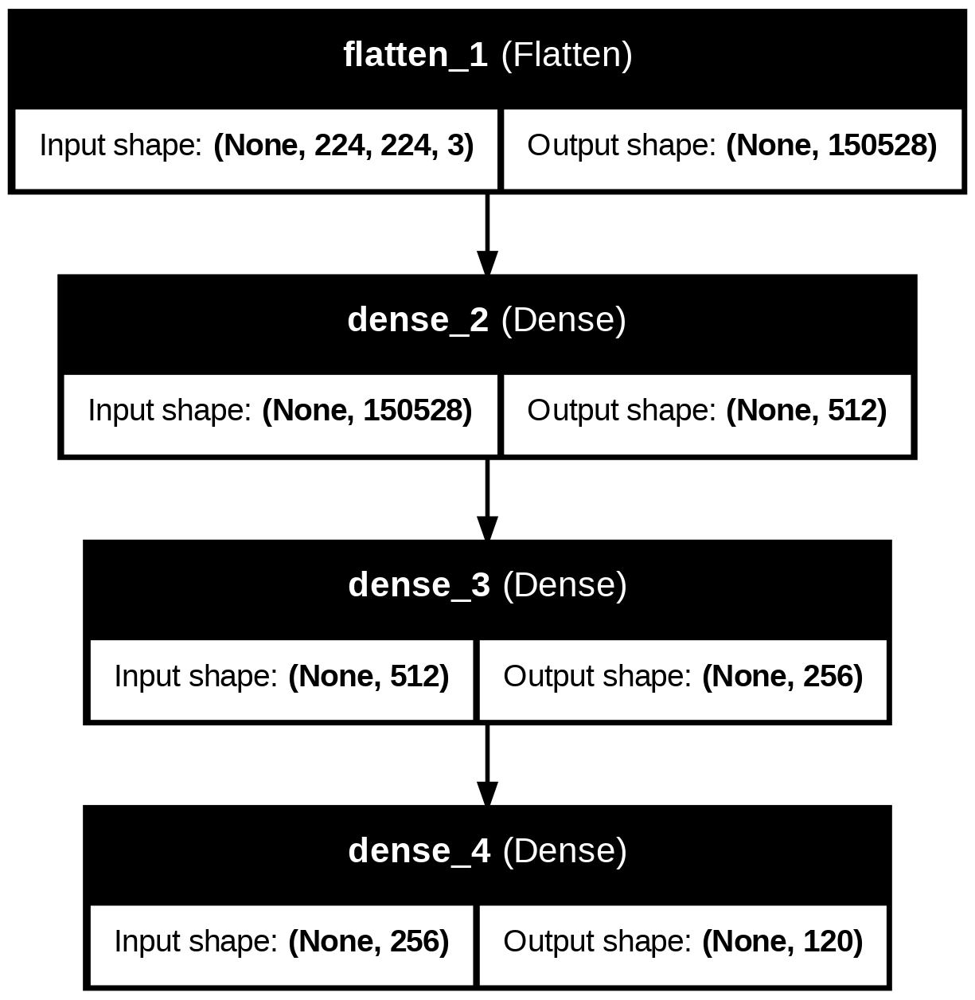

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True)

In [ ]:
model.save('stanford-dogs-dataset-MLP.keras')

MLP tempo treino 2h e 4 min 11 s
val_acc = 0.0393 early stopping 58/100 epochs

# LSTM

In [ ]:
model = tf.keras.Sequential([
  tf.keras.layers.Reshape((img_height, img_width * 3), input_shape=(img_height, img_width, 3)),

  tf.keras.layers.LSTM(128, activation='relu', return_sequences=True),
  tf.keras.layers.LayerNormalization(),
  tf.keras.layers.Dropout(0.3),

  tf.keras.layers.LSTM(256, activation='relu', return_sequences=True),
  tf.keras.layers.LayerNormalization(),
  tf.keras.layers.Dropout(0.3),

  tf.keras.layers.LSTM(512, activation='relu'),
  tf.keras.layers.LayerNormalization(),
  tf.keras.layers.Dropout(0.3),

  tf.keras.layers.Dense(512, activation='relu'),
  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Dense(num_classes, activation='softmax')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape (Reshape)               │ (None, 224, 672)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 224, 128)       │       410,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ layer_normalization             │ (None, 224, 128)       │           256 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 224, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 224, 256)       │       394,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ layer_normalization_1           │ (None, 224, 256)       │           512 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 224, 256)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 512)            │     1,574,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ layer_normalization_2           │ (None, 512)            │         1,024 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 120)            │        61,560 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,705,272 (10.32 MB)

 Trainable params: 2,705,272 (10.32 MB)

 Non-trainable params: 0 (0.00 B)

# Modelos Transfer Learning (InceptionV3)

In [ ]:
InceptionV3 = tf.keras.applications.InceptionV3(include_top= False, input_shape=(img_width, img_height, 3), weights= 'imagenet')
InceptionV3.summary()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 111, 111,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 111, 111,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 109, 109,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 109, 109,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 54, 54,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 54, 54,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 52, 52,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 21,768,352 (83.04 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [ ]:
model = tf.keras.Sequential()

for layer in InceptionV3.layers:
    layer.trainable= False

model.add(InceptionV3)
model.add(tf.keras.layers.GlobalAveragePooling2D())
model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.Dense(120, activation='softmax'))
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)       │ (None, 5, 5, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       245,880 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,048,664 (84.11 MB)

 Trainable params: 245,880 (960.47 KB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:
model.save('stanford-dogs-dataset-InceptionV3-TL.keras')

tempo a treinar 45 min, early stopping, val_acc 0.8670

# Modelos Transfer Learning (ResNet50)

In [ ]:
%%time
base_model = ResNet50(include_top=False, weights='imagenet', input_shape=(img_height,img_width,3))

for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.5)(x)
predictions = tf.keras.layers.Dense(120, activation='softmax', kernel_initializer='random_uniform', bias_initializer='zeros')(x)
model = tf.keras.models.Model(inputs=base_model.input, outputs=predictions)

CPU times: user 2.15 s, sys: 264 ms, total: 2.41 s
Wall time: 2.5 s


In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=3,
    verbose=1,
    mode='auto'
)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
    'baseline_model_ResNet50.keras',
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    mode='auto',
    save_weights_only=False,
)

reduceLR = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=3,
    verbose=1,
    mode='auto'
)

callbacks = [earlystop, checkpoint, reduceLR]

In [ ]:
%%time
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
loss = "categorical_crossentropy"
e = 100

model.compile(optimizer=optimizer,
              loss=loss,
              metrics=["accuracy"])

#model.summary()

params = model.fit(train_generator,
                                steps_per_epoch=len(train_generator.filenames)//batch_size,
                                validation_data=test_generator,
                                validation_steps=len(test_generator.filenames)//batch_size,
                                epochs=e,
                                callbacks=[reducelr,earlystop,checkpoint])

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 0s 886ms/step - accuracy: 0.0122 - loss: 5.7134
Epoch 1: val_accuracy improved from -inf to 0.10216, saving model to dog_breed_classifier.keras
150/150 ━━━━━━━━━━━━━━━━━━━━ 178s 1s/step - accuracy: 0.0122 - loss: 5.7109 - val_accuracy: 0.1022 - val_loss: 4.0272 - learning_rate: 1.0000e-04
Epoch 2/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 0s 870ms/step - accuracy: 0.0645 - loss: 4.4410
Epoch 2: val_accuracy improved from 0.10216 to 0.25661, saving model to dog_breed_classifier.keras
150/150 ━━━━━━━━━━━━━━━━━━━━ 154s 1s/step - accuracy: 0.0646 - loss: 4.4397 - val_accuracy: 0.2566 - val_loss: 3.2721 - learning_rate: 1.0000e-04
Epoch 3/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 0s 863ms/step - accuracy: 0.1464 - loss: 3.6652
Epoch 3: val_accuracy improved from 0.25661 to 0.36118, saving model to dog_breed_classifier.keras
150/150 ━━━━━━━━━━━━━━━━━━━━ 153s 1s/step - accuracy: 0.1465 - loss: 3.6643 - val_accuracy: 0.3612 - val_loss: 2.7617 - learning_rate: 1.0000e-04
E

27/27 - 23s - 839ms/step - accuracy: 0.6537 - loss: 1.2290


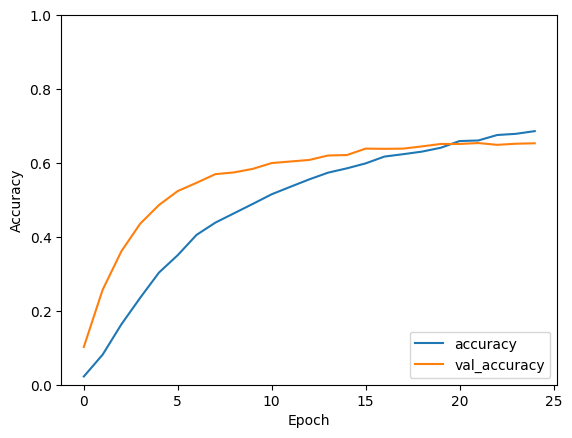

In [ ]:
plt.plot(params.history['accuracy'], label='accuracy')
plt.plot(params.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(test_generator, verbose=2)

In [ ]:
model.save('stanford-dogs-dataset-Resnet50-TL.keras')

# Modelos Transfer Learning (ViT-16b-fe)

In [ ]:
import tensorflow_hub as hub
import tf_keras

vit_model_url = "https://www.kaggle.com/models/spsayakpaul/vision-transformer/TensorFlow2/vit-b16-fe/1"
classifier_model = vit_model_url

IMAGE_SHAPE = (224, 224)

classifier = tf_keras.Sequential([
    hub.KerasLayer(classifier_model, input_shape=IMAGE_SHAPE+(3,)),
    tf_keras.layers.Dense(120, activation='softmax')
])

In [ ]:
classifier.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
classifier.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 768)               85798656  
                                                                 
 dense (Dense)               (None, 120)               92280     
                                                                 
Total params: 85890936 (327.65 MB)
Trainable params: 92280 (360.47 KB)
Non-trainable params: 85798656 (327.30 MB)
_________________________________________________________________


In [ ]:
checkpoint = tf_keras.callbacks.ModelCheckpoint('stanford-dogs-TTL-modelCheckpoint.keras',
                             monitor='val_accuracy',
                             save_best_only=True,
                             verbose=1,
                             mode='auto',
                             save_weights_only=False)

earlystop = tf_keras.callbacks.EarlyStopping(monitor='val_accuracy',
                          min_delta=.0001,
                          patience=3,
                          verbose=1,
                          mode='auto',
                          baseline=None,
                          restore_best_weights=True)

reducelr = tf_keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy',
                             factor=np.sqrt(.1),
                             patience=3,
                             verbose=1,
                             mode='auto',
                             min_delta=.0001,
                             cooldown=0,
                             min_lr=0.0000001)

callbacks = [checkpoint, earlystop, reducelr]

history = classifier.fit(
    train_generator,
    epochs = 100,
    steps_per_epoch = nb_train_samples//batch_size,
    validation_data = valid_generator,
    validation_steps = nb_valid_samples//batch_size,
    verbose = 2,
    callbacks = callbacks,
    shuffle = True
)

Epoch 1/100

Epoch 1: val_accuracy improved from -inf to 0.83024, saving model to stanford-dogs-TTL-modelCheckpoint.keras
150/150 - 149s - loss: 1.3917 - accuracy: 0.6589 - val_loss: 0.5513 - val_accuracy: 0.8302 - lr: 0.0010 - 149s/epoch - 993ms/step
Epoch 2/100

Epoch 2: val_accuracy improved from 0.83024 to 0.85274, saving model to stanford-dogs-TTL-modelCheckpoint.keras
150/150 - 135s - loss: 0.4542 - accuracy: 0.8542 - val_loss: 0.5199 - val_accuracy: 0.8527 - lr: 0.0010 - 135s/epoch - 902ms/step
Epoch 3/100

Epoch 3: val_accuracy did not improve from 0.85274
150/150 - 131s - loss: 0.3462 - accuracy: 0.8888 - val_loss: 0.4869 - val_accuracy: 0.8455 - lr: 0.0010 - 131s/epoch - 873ms/step
Epoch 4/100

Epoch 4: val_accuracy improved from 0.85274 to 0.86344, saving model to stanford-dogs-TTL-modelCheckpoint.keras
150/150 - 131s - loss: 0.2888 - accuracy: 0.9041 - val_loss: 0.4767 - val_accuracy: 0.8634 - lr: 0.0010 - 131s/epoch - 874ms/step
Epoch 5/100

Epoch 5: val_accuracy improved 

early stopping 17 min; loss: 0.1635 - accuracy: 0.9431 - val_loss: 0.5055 - val_accuracy: 0.8617; 8 epochs

In [ ]:
classifier.save('stanford-dogs-dataset-ViT-b16-fe-TL.keras')

# Treinar modelo

In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=3,
    verbose=1,
    mode='auto'
)

reduceLR = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=3,
    verbose=1,
    mode='auto'
)

callbacks = [earlystop, reduceLR]

history = model.fit(
    train_generator,
    epochs = 100,
    steps_per_epoch = nb_train_samples//batch_size,
    validation_data = valid_generator,
    validation_steps = nb_valid_samples//batch_size,
    verbose = 2,
    callbacks = callbacks,
    shuffle = True
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
150/150 - 122s - 812ms/step - accuracy: 0.0082 - loss: nan - val_accuracy: 0.0080 - val_loss: nan - learning_rate: 1.0000e-04
Epoch 2/100
150/150 - 109s - 724ms/step - accuracy: 0.0083 - loss: nan - val_accuracy: 0.0084 - val_loss: nan - learning_rate: 1.0000e-04
Epoch 3/100

Epoch 3: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
150/150 - 109s - 727ms/step - accuracy: 0.0083 - loss: nan - val_accuracy: 0.0084 - val_loss: nan - learning_rate: 1.0000e-04
Epoch 4/100
150/150 - 109s - 725ms/step - accuracy: 0.0083 - loss: nan - val_accuracy: 0.0080 - val_loss: nan - learning_rate: 1.0000e-05
Epoch 4: early stopping


# Avaliar modelo

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


135/135 - 14s - 106ms/step - accuracy: 0.1706 - loss: 3.3347


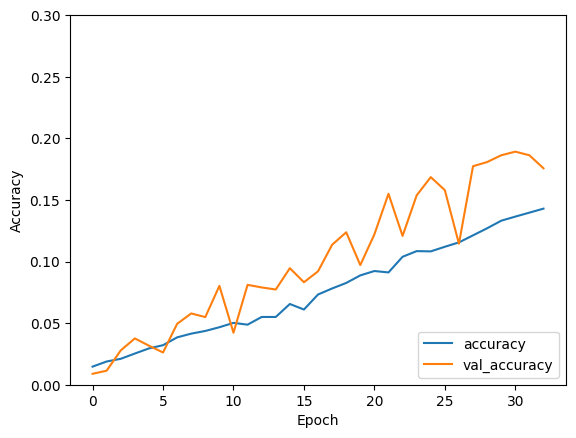

In [ ]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 0.3])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(test_generator, verbose=2)

# Classification report

In [ ]:
#model = tf.keras.models.load_model('/content/stanford-dogs-dataset-InceptionV3-TL.keras')

In [ ]:
pred = model.predict(test_generator, verbose=1)
y_pred = np.argmax(pred, axis=1)
y_true = test_generator.classes

KeyboardInterrupt: 

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.71      0.80        52
           1       0.93      0.91      0.92        85
           2       0.93      0.88      0.90       152
           3       0.93      0.84      0.88        49
           4       0.83      0.73      0.78       114
           5       0.94      0.95      0.95        88
           6       0.95      0.95      0.95        96
           7       0.78      0.92      0.84        72
           8       0.75      0.71      0.73        72
           9       0.96      0.98      0.97       139
          10       0.82      0.97      0.89        75
          11       0.80      0.77      0.78        95
          12       0.93      0.90      0.91        87
          13       0.94      0.92      0.93        71
          14       0.85      0.80      0.82        59
          15       0.62      0.66      0.64        53
          16       0.72      0.60      0.65        57
          17       0.70    

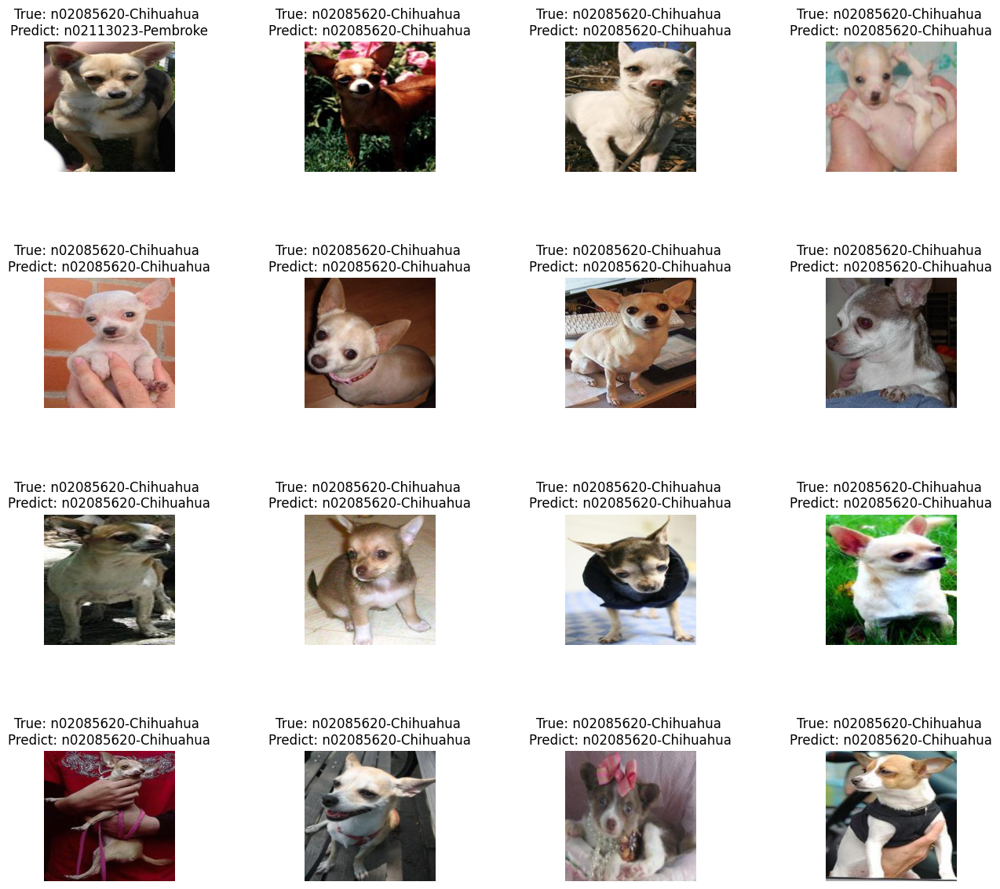

In [ ]:
fig, axes = plt.subplots(4, 4, figsize=(15,15))
axes = axes.ravel()
class_labels = list(train_generator.class_indices.keys())

for i in np.arange(16):
    axes[i].imshow(test_generator[0][0][i])
    axes[i].set_title('True: %s \nPredict: %s' % (class_labels[y_true[i]], class_labels[y_pred[i]]))
    axes[i].axis('off')
    plt.subplots_adjust(wspace=1)

# Carregar modelo e obter as melhores e piores classificações

In [ ]:
# model = tf.keras.models.load_model('stanford-dogs-dataset-InceptionV3-TL.keras')

In [ ]:
test_loss, test_acc = model.evaluate(test_generator, verbose=2)
loss, acc = model.evaluate(train_generator, verbose=2)
val_loss, val_acc = model.evaluate(valid_generator, verbose=2)

In [ ]:
from sklearn.metrics import classification_report
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

pred = model.predict(test_generator, verbose=1)
y_pred = np.argmax(pred, axis=1)
y_true = test_generator.classes

report = classification_report(y_true, y_pred, output_dict=True)

df_report = pd.DataFrame(report).transpose()

df_report = df_report.drop(['accuracy', 'macro avg', 'weighted avg'])

df_report_sorted = df_report.sort_values(by='f1-score')

class_labels = list(test_generator.class_indices.keys())

num_classes_to_show = 3
worst_classes_indices = df_report_sorted.head(num_classes_to_show).index.astype(int)
best_classes_indices = df_report_sorted.tail(num_classes_to_show).index.astype(int)

worst_classes_names = [class_labels[i] for i in worst_classes_indices]
best_classes_names = [class_labels[i] for i in best_classes_indices]

print("Classes com pior f1-score:")
print(df_report_sorted.head(num_classes_to_show))
print("Classes com melhor f1-score:")
print(df_report_sorted.tail(num_classes_to_show))

135/135 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step
Classes com pior f1-score:
     precision    recall  f1-score  support
97    0.346939  0.340000  0.343434     50.0
114   0.727273  0.436364  0.545455     55.0
99    0.567010  0.597826  0.582011     92.0
Classes com melhor f1-score:
     precision    recall  f1-score  support
39    1.000000  0.960784  0.980000    102.0
109   0.983051  1.000000  0.991453     58.0
119   0.985714  1.000000  0.992806     69.0



Displaying sample images for worst performing classes:

Sample images for class: n02109961-Eskimo_dog


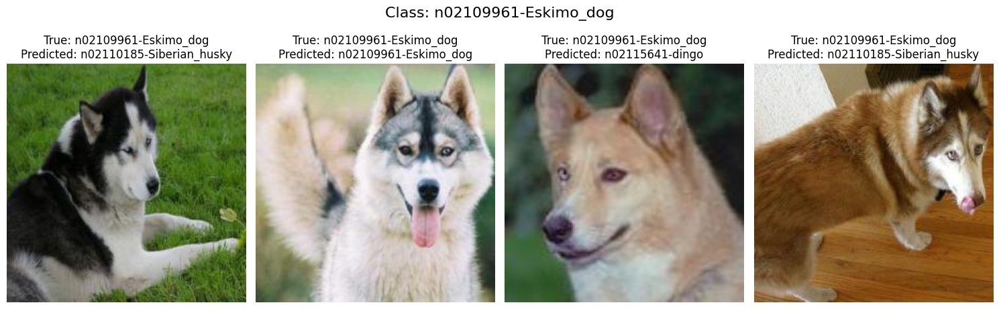


Sample images for class: n02113712-miniature_poodle


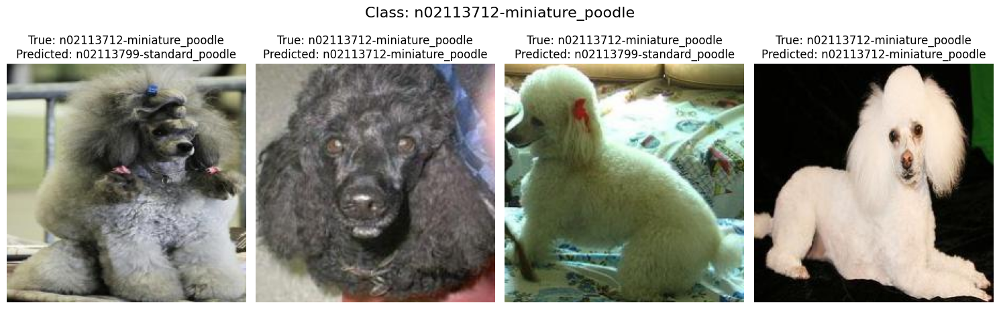


Sample images for class: n02110185-Siberian_husky


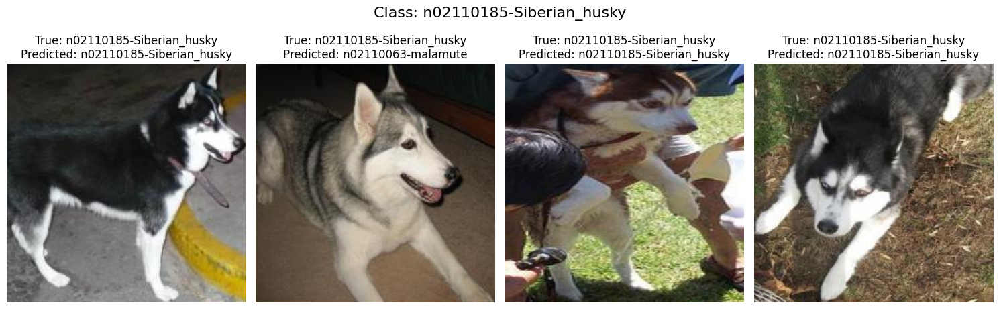

In [ ]:
def display_sample_images(data_generator, class_indices, num_samples):
    class_labels = list(data_generator.class_indices.keys())
    for class_idx in class_indices:
        class_name = class_labels[class_idx]
        print(f"\nSample images for class: {class_name}")

        indices = np.where(data_generator.classes == class_idx)[0]
        if len(indices) == 0:
            print("No images found for this class in the generator.")
            continue

        sample_indices = np.random.choice(indices, min(num_samples, len(indices)), replace=False)

        plt.figure(figsize=(15, 5))
        plt.suptitle(f"Class: {class_name}", fontsize=16)

        for i, sample_idx in enumerate(sample_indices):
            img_path = os.path.join(data_generator.directory, data_generator.filenames[sample_idx])

            img = plt.imread(img_path)
            plt.subplot(1, num_samples, i + 1)
            plt.imshow(img)
            plt.title(f"True: {class_name}\nPredicted: {class_labels[y_pred[sample_idx]]}")
            plt.axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

display_sample_images(test_generator, worst_classes_indices, num_samples=4)


Displaying sample images for best performing classes:

Sample images for class: n02095889-Sealyham_terrier


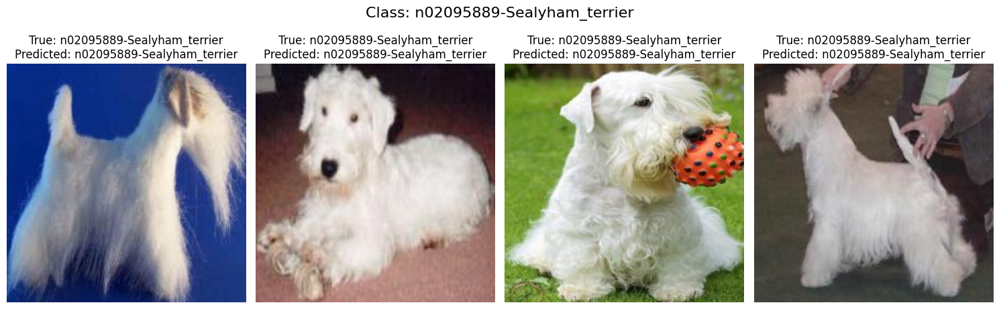


Sample images for class: n02112350-keeshond


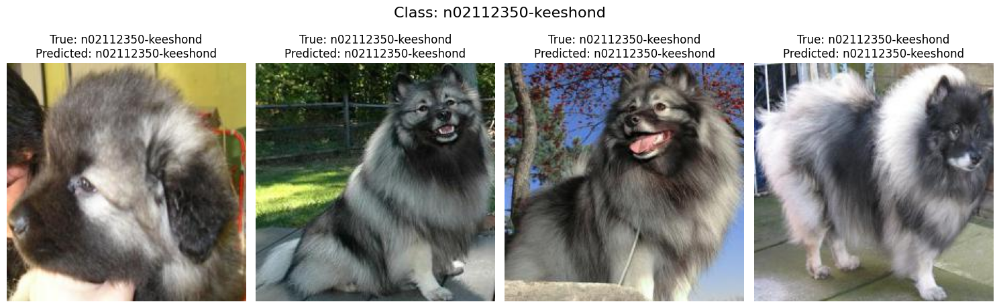


Sample images for class: n02116738-African_hunting_dog


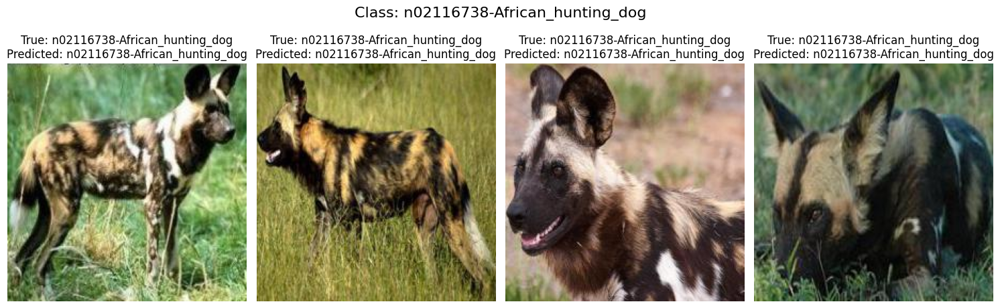

In [ ]:
display_sample_images(test_generator, best_classes_indices, num_samples=4)

# Matriz de confusão e top 10 pares

In [ ]:
# model = tf.keras.models.load_model('stanford-dogs-dataset-InceptionV3-TL.keras')

In [11]:
pred = model.predict(test_generator, verbose=1)
y_pred = np.argmax(pred, axis=1)
y_true = test_generator.classes

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


135/135 ━━━━━━━━━━━━━━━━━━━━ 40s 194ms/step


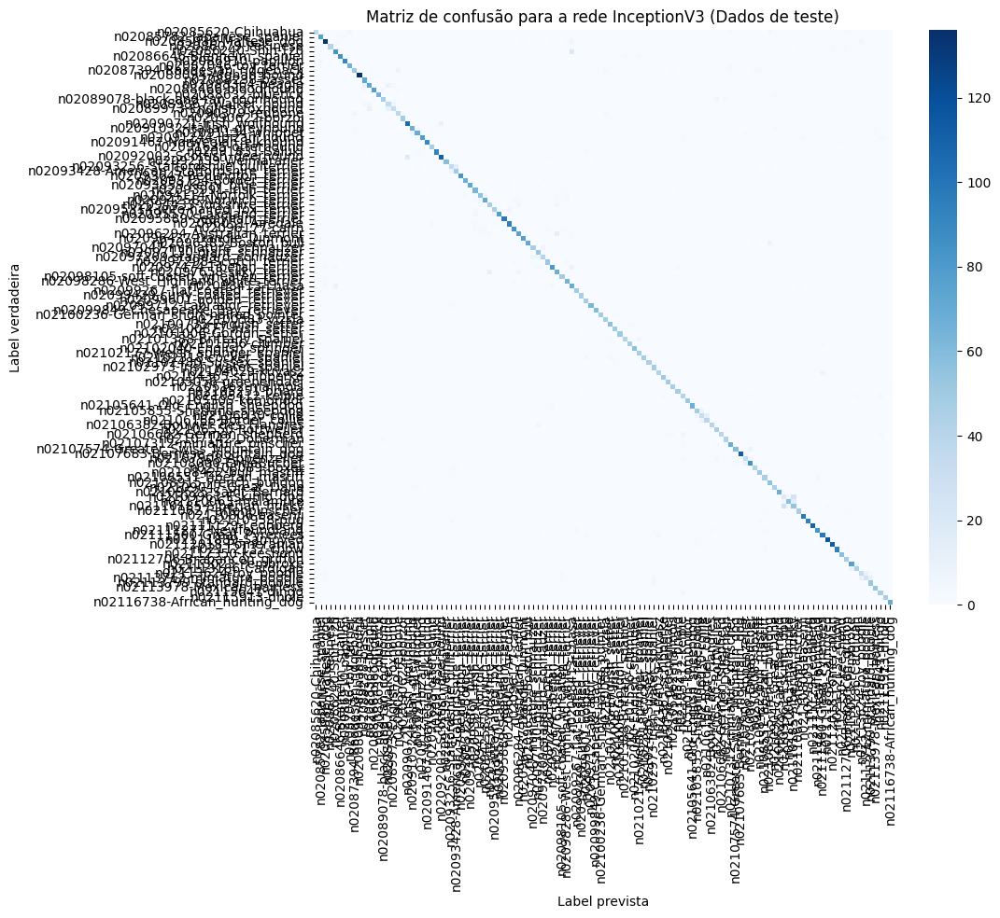

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=False, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.title("Matriz de confusão para a rede InceptionV3 (Dados de teste)")
plt.xlabel("Label prevista")
plt.ylabel("Label verdadeira")
plt.show()

<ipython-input-13-6b03a6396f0c>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts, y=labels, palette="viridis")


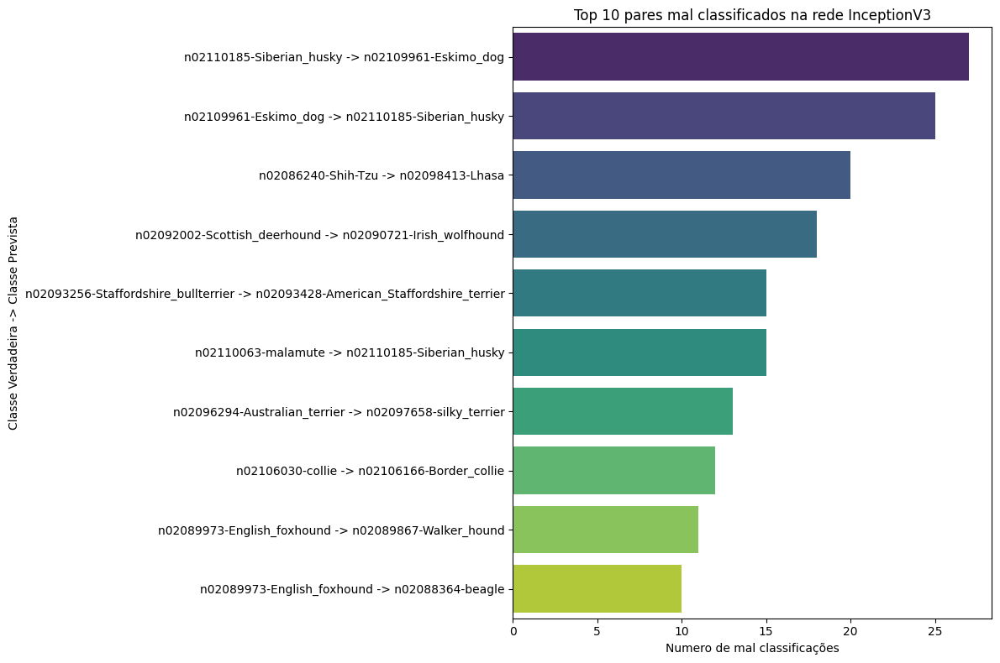

In [ ]:
misclassified_pairs = []

for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        if i != j:
            true_class = class_labels[i]
            predicted_class = class_labels[j]
            count = cm[i, j]
            misclassified_pairs.append(((true_class, predicted_class), count))

misclassified_pairs.sort(key=lambda item: item[1], reverse=True)

top_10_misclassified = misclassified_pairs[:10]

labels = [f"{pair[0]} -> {pair[1]}" for pair, count in top_10_misclassified]
counts = [count for pair, count in top_10_misclassified]

plt.figure(figsize=(12, 8))
sns.barplot(x=counts, y=labels, palette="viridis")
plt.title("Top 10 pares mal classificados na rede InceptionV3")
plt.xlabel("Numero de mal classificações")
plt.ylabel("Classe Verdadeira -> Classe Prevista")
plt.tight_layout()
plt.show()

In [ ]:
print(labels)

['n02110185-Siberian_husky -> n02109961-Eskimo_dog', 'n02109961-Eskimo_dog -> n02110185-Siberian_husky', 'n02086240-Shih-Tzu -> n02098413-Lhasa', 'n02092002-Scottish_deerhound -> n02090721-Irish_wolfhound', 'n02093256-Staffordshire_bullterrier -> n02093428-American_Staffordshire_terrier', 'n02110063-malamute -> n02110185-Siberian_husky', 'n02096294-Australian_terrier -> n02097658-silky_terrier', 'n02106030-collie -> n02106166-Border_collie', 'n02089973-English_foxhound -> n02089867-Walker_hound', 'n02089973-English_foxhound -> n02088364-beagle']


# Cross Validation (InceptionV3)

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report

num_folds = 5

skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

fold_accuracies = []
fold_losses = []
classification_reports = []

train_data_dir = '/content/stanford-dogs-dataset-traintest/cropped/train'
test_data_dir = '/content/stanford-dogs-dataset-traintest/cropped/test'

image_paths = []
labels = []

img_height = 224
img_width = 224
batch_size = 32
num_classes = 120

class_names = os.listdir(train_data_dir)
class_indices = {class_name: idx for idx, class_name in enumerate(class_names)}

for class_name in class_names:
    class_dir = os.path.join(train_data_dir, class_name)
    for img_name in os.listdir(class_dir):
        if img_name.lower().endswith(('jpg', 'jpeg', 'png')):
            image_paths.append(os.path.join(class_dir, img_name))
            labels.append(class_indices[class_name])

image_paths = np.array(image_paths)
labels = np.array(labels)

In [ ]:
for fold, (train_index, val_index) in enumerate(skf.split(image_paths, labels)):
    print(f"--- Fold {fold + 1}/{num_folds} ---")

    train_paths, val_paths = image_paths[train_index], image_paths[val_index]
    train_labels, val_labels = labels[train_index], labels[val_index]

    train_df = pd.DataFrame({'filename': train_paths, 'class': [class_names[i] for i in train_labels]})
    val_df = pd.DataFrame({'filename': val_paths, 'class': [class_names[i] for i in val_labels]})

    train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
    )
    valid_datagen = ImageDataGenerator(rescale=1./255)

    train_generator_fold = train_datagen.flow_from_dataframe(
        train_df,
        x_col='filename',
        y_col='class',
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical',
        seed=1337
    )

    valid_generator_fold = valid_datagen.flow_from_dataframe(
        val_df,
        x_col='filename',
        y_col='class',
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical',
        seed=1337
    )

    InceptionV3_base = tf.keras.applications.InceptionV3(include_top=False, input_shape=(img_width, img_height, 3), weights='imagenet')

    model = tf.keras.Sequential()
    for layer in InceptionV3_base.layers:
        layer.trainable = False

    model.add(InceptionV3_base)
    model.add(tf.keras.layers.GlobalAveragePooling2D())
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Dense(num_classes, activation='softmax'))

    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    earlystop = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        min_delta=0.001,
        patience=3,
        verbose=1,
        mode='auto'
    )

    reduceLR = tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.1,
        patience=3,
        verbose=1,
        mode='auto'
    )

    callbacks = [earlystop, reduceLR]

    history = model.fit(
        train_generator_fold,
        epochs=100,
        steps_per_epoch=len(train_generator_fold),
        validation_data=valid_generator_fold,
        validation_steps=len(valid_generator_fold),
        verbose=2,
        callbacks=callbacks
    )

    print(f"Evaluating model for Fold {fold + 1} on the test set...")
    test_loss, test_acc = model.evaluate(test_generator, verbose=2)
    fold_losses.append(test_loss)
    fold_accuracies.append(test_acc)
    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}")

    print(f"Generating classification report for Fold {fold + 1}...")
    pred = model.predict(test_generator, verbose=1)
    y_pred = np.argmax(pred, axis=1)
    y_true = test_generator.classes
    report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
    classification_reports.append(report)

--- Fold 1/5 ---
Found 9600 validated image filenames belonging to 120 classes.
Found 2400 validated image filenames belonging to 120 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
300/300 - 126s - 419ms/step - accuracy: 0.6415 - loss: 1.4267 - val_accuracy: 0.8279 - val_loss: 0.5265 - learning_rate: 1.0000e-03
Epoch 2/100
300/300 - 103s - 344ms/step - accuracy: 0.7693 - loss: 0.8050 - val_accuracy: 0.8458 - val_loss: 0.5071 - learning_rate: 1.0000e-03
Epoch 3/100
300/300 - 103s - 342ms/step - accuracy: 0.7802 - loss: 0.7711 - val_accuracy: 0.8300 - val_loss: 0.5450 - learning_rate: 1.0000e-03
Epoch 4/100
300/300 - 103s - 343ms/step - accuracy: 0.7915 - loss: 0.7285 - val_accuracy: 0.8379 - val_loss: 0.5439 - learning_rate: 1.0000e-03
Epoch 5/100

Epoch 5: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
300/300 - 103s - 343ms/step - accuracy: 0.7989 - loss: 0.6860 - val_accuracy: 0.8313 - val_loss: 0.5614 - learning_rate: 1.0000e-03
Epoch 5: early stopping
Evaluating model for Fold 1 on the test set...
135/135 - 28s - 210ms/step - accuracy: 0.8396 - loss: 0.5525
Test Loss: 0.5525, Test Accuracy: 0.8396
Generating classification rep

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
300/300 - 120s - 399ms/step - accuracy: 0.6438 - loss: 1.4067 - val_accuracy: 0.8283 - val_loss: 0.5655 - learning_rate: 1.0000e-03
Epoch 2/100
300/300 - 102s - 340ms/step - accuracy: 0.7624 - loss: 0.8175 - val_accuracy: 0.8300 - val_loss: 0.5523 - learning_rate: 1.0000e-03
Epoch 3/100
300/300 - 103s - 343ms/step - accuracy: 0.7870 - loss: 0.7508 - val_accuracy: 0.8417 - val_loss: 0.5361 - learning_rate: 1.0000e-03
Epoch 4/100
300/300 - 104s - 345ms/step - accuracy: 0.7927 - loss: 0.7158 - val_accuracy: 0.8346 - val_loss: 0.5877 - learning_rate: 1.0000e-03
Epoch 5/100
300/300 - 102s - 339ms/step - accuracy: 0.7995 - loss: 0.6983 - val_accuracy: 0.8346 - val_loss: 0.5790 - learning_rate: 1.0000e-03
Epoch 6/100

Epoch 6: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
300/300 - 103s - 344ms/step - accuracy: 0.8034 - loss: 0.6769 - val_accuracy: 0.8425 - val_loss: 0.5915 - learning_rate: 1.0000e-03
Epoch 6: early stopping
Evaluating model for Fold 2 on the

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
300/300 - 121s - 402ms/step - accuracy: 0.6520 - loss: 1.3876 - val_accuracy: 0.8283 - val_loss: 0.5646 - learning_rate: 1.0000e-03
Epoch 2/100
300/300 - 104s - 345ms/step - accuracy: 0.7632 - loss: 0.8150 - val_accuracy: 0.8304 - val_loss: 0.5815 - learning_rate: 1.0000e-03
Epoch 3/100
300/300 - 103s - 344ms/step - accuracy: 0.7855 - loss: 0.7588 - val_accuracy: 0.8379 - val_loss: 0.5801 - learning_rate: 1.0000e-03
Epoch 4/100

Epoch 4: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
300/300 - 102s - 340ms/step - accuracy: 0.7921 - loss: 0.7096 - val_accuracy: 0.8363 - val_loss: 0.5911 - learning_rate: 1.0000e-03
Epoch 4: early stopping
Evaluating model for Fold 3 on the test set...
135/135 - 18s - 134ms/step - accuracy: 0.8450 - loss: 0.5423
Test Loss: 0.5423, Test Accuracy: 0.8450
Generating classification report for Fold 3...
135/135 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step
--- Fold 4/5 ---
Found 9600 validated image filenames belonging to 120 classes.
Fo

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
300/300 - 119s - 395ms/step - accuracy: 0.6398 - loss: 1.4280 - val_accuracy: 0.8375 - val_loss: 0.5171 - learning_rate: 1.0000e-03
Epoch 2/100
300/300 - 103s - 343ms/step - accuracy: 0.7661 - loss: 0.8005 - val_accuracy: 0.8375 - val_loss: 0.5869 - learning_rate: 1.0000e-03
Epoch 3/100
300/300 - 102s - 340ms/step - accuracy: 0.7896 - loss: 0.7339 - val_accuracy: 0.8454 - val_loss: 0.5169 - learning_rate: 1.0000e-03
Epoch 4/100
300/300 - 103s - 343ms/step - accuracy: 0.7881 - loss: 0.7338 - val_accuracy: 0.8496 - val_loss: 0.5303 - learning_rate: 1.0000e-03
Epoch 4: early stopping
Evaluating model for Fold 4 on the test set...
135/135 - 17s - 128ms/step - accuracy: 0.8505 - loss: 0.5231
Test Loss: 0.5231, Test Accuracy: 0.8505
Generating classification report for Fold 4...
135/135 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step
--- Fold 5/5 ---
Found 9600 validated image filenames belonging to 120 classes.
Found 2400 validated image filenames belonging to 120 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
300/300 - 120s - 401ms/step - accuracy: 0.6438 - loss: 1.4010 - val_accuracy: 0.8208 - val_loss: 0.5946 - learning_rate: 1.0000e-03
Epoch 2/100
300/300 - 102s - 341ms/step - accuracy: 0.7669 - loss: 0.8102 - val_accuracy: 0.8304 - val_loss: 0.5663 - learning_rate: 1.0000e-03
Epoch 3/100
300/300 - 102s - 339ms/step - accuracy: 0.7859 - loss: 0.7429 - val_accuracy: 0.8225 - val_loss: 0.6145 - learning_rate: 1.0000e-03
Epoch 4/100
300/300 - 103s - 343ms/step - accuracy: 0.7899 - loss: 0.7087 - val_accuracy: 0.8400 - val_loss: 0.5645 - learning_rate: 1.0000e-03
Epoch 5/100
300/300 - 103s - 344ms/step - accuracy: 0.7986 - loss: 0.6978 - val_accuracy: 0.8388 - val_loss: 0.6028 - learning_rate: 1.0000e-03
Epoch 6/100
300/300 - 103s - 342ms/step - accuracy: 0.7987 - loss: 0.6899 - val_accuracy: 0.8283 - val_loss: 0.6426 - learning_rate: 1.0000e-03
Epoch 7/100

Epoch 7: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
300/300 - 103s - 343ms/step - accuracy: 0.8106

49 min

In [ ]:
print("\n--- Average Metrics Across Folds ---")
print(f"Average Test Loss: {np.mean(fold_losses):.4f}")
print(f"Average Test Accuracy: {np.mean(fold_accuracies):.4f}")


--- Average Metrics Across Folds ---
Average Test Loss: 0.5623
Average Test Accuracy: 0.8410


In [ ]:
for i in range(num_folds):
    print(f"\n--- Classification Report for Fold {i + 1} ---")
    print(classification_reports[i])


--- Classification Report for Fold 1 ---
{'n02110185-Siberian_husky': {'precision': 0.9090909090909091, 'recall': 0.7692307692307693, 'f1-score': 0.8333333333333334, 'support': 52.0}, 'n02104029-kuvasz': {'precision': 0.7938144329896907, 'recall': 0.9058823529411765, 'f1-score': 0.8461538461538461, 'support': 85.0}, 'n02110627-affenpinscher': {'precision': 0.9383561643835616, 'recall': 0.9013157894736842, 'f1-score': 0.9194630872483222, 'support': 152.0}, 'n02109525-Saint_Bernard': {'precision': 0.9210526315789473, 'recall': 0.7142857142857143, 'f1-score': 0.8045977011494253, 'support': 49.0}, 'n02108915-French_bulldog': {'precision': 0.7913043478260869, 'recall': 0.7982456140350878, 'f1-score': 0.7947598253275109, 'support': 114.0}, 'n02101556-clumber': {'precision': 0.9629629629629629, 'recall': 0.8863636363636364, 'f1-score': 0.9230769230769231, 'support': 88.0}, 'n02099601-golden_retriever': {'precision': 0.9081632653061225, 'recall': 0.9270833333333334, 'f1-score': 0.917525773195

In [ ]:
for i in range(num_folds):
  print(f"\n--- Loss in Fold {i + 1} ---")
  print(fold_losses)
  print(f"\n--- Accuracy in Fold {i + 1} ---")
  print(fold_accuracies)


--- Loss in Fold 1 ---
[0.5524511933326721, 0.5896456837654114, 0.5423048734664917, 0.5231181979179382, 0.6041709184646606]

--- Accuracy in Fold 1 ---
[0.8396270275115967, 0.8357808589935303, 0.8449883460998535, 0.8504661917686462, 0.8339160680770874]

--- Loss in Fold 2 ---
[0.5524511933326721, 0.5896456837654114, 0.5423048734664917, 0.5231181979179382, 0.6041709184646606]

--- Accuracy in Fold 2 ---
[0.8396270275115967, 0.8357808589935303, 0.8449883460998535, 0.8504661917686462, 0.8339160680770874]

--- Loss in Fold 3 ---
[0.5524511933326721, 0.5896456837654114, 0.5423048734664917, 0.5231181979179382, 0.6041709184646606]

--- Accuracy in Fold 3 ---
[0.8396270275115967, 0.8357808589935303, 0.8449883460998535, 0.8504661917686462, 0.8339160680770874]

--- Loss in Fold 4 ---
[0.5524511933326721, 0.5896456837654114, 0.5423048734664917, 0.5231181979179382, 0.6041709184646606]

--- Accuracy in Fold 4 ---
[0.8396270275115967, 0.8357808589935303, 0.8449883460998535, 0.8504661917686462, 0.83

In [ ]:
import numpy as np

loss_std = np.std(fold_losses)
loss_variance = np.var(fold_losses)

accuracy_std = np.std(fold_accuracies)
accuracy_variance = np.var(fold_accuracies)

print("\n--- Variability Metrics Across Folds ---")
print(f"Loss Standard Deviation: {loss_std:.4f}")
print(f"Loss Variance: {loss_variance:.4f}")
print(f"Accuracy Standard Deviation: {accuracy_std:.4f}")
print(f"Accuracy Variance: {accuracy_variance:.4f}")


--- Variability Metrics Across Folds ---
Loss Standard Deviation: 0.0301
Loss Variance: 0.0009
Accuracy Standard Deviation: 0.0061
Accuracy Variance: 0.0000
